# Random Walk

In [1]:
import numpy as np
import pandas as pd
import pandas_datareader as pdr
import datetime
import matplotlib.pyplot as plt
import statsmodels.api as sm
import statsmodels.formula.api as smf
import scipy.stats as stats
from supplementaryFunctions import *

plt.rcParams['axes.xmargin'] = 0
plt.rcParams['axes.ymargin'] =0
plt.rcParams.update({"font.size" : 40})

### <center>Gauss-Markov Assumptions</center>

|Assumption No.|Brief Summary|Description|
|---|---|---|
|$MLR.1$| Linear in Parameters: $y = \beta_0 + \beta_1x+u$| In the population model, the dependent variable, $y$, is related to the independent variable, $x$, and the error term, $u$ where $\beta_0$ and $\beta_1$ are the population intercept and slope parameters, respectively.|
|$MLR.2$| Random Sampling of $x$ and $y$ from the Population|We have a random sample of size $n$, ${(x_i,y_i): i = 1,2,...,n}$, following the population model in Assumption MLR.1.|
|$MLR.3$| No Perfect Collinearity | In the sample (and therefore the population), none of the independent variables is constant, and there are no exact _linear_ relationships among the independent variables|
|$MLR.4$| Zero Conditional Mean: $E(u|x_1, x_2, . . . , x_k)=0$|The error $u$ has an expected value of zero given any values of the independent variables|
|$MLR.5$| Homoscedasticity: $Var(u|x_1, x_2, . . . , x_k) = \sigma^2$|The error $u$ has constant variance given any value of the explanatory variables|

### <center>Properties of OLS</center>
|Theorem No.|Summary|Description|
|---|---|---|
|Theorem 3.1|Unbiasedness of OLS| Under $MLR.1-MLR.4$, all parameter estimators are unbiased: $E(\hat{\beta_j})=\beta_j, j=0,1,...,k$|
|Thereom 3.2| Sampling Variances of the OLS Slope Estimators |Under Assumptions $MLR.1-MLR.5$, conditional on the sample values of the independent variables, $Var(\hat{\beta_j})=\frac{\sigma^2}{SST_j(1-R_j^2)'}$, for $j = 1,2, . . ., k$, where $SST_j=\sum_{i=1}^{n}{(x_{ij}-\bar{x_j})^2}$ is the total sample variation in $x_j$, and $R_j^2$ is the $R$-squared from regressing $x_j$ on all other independent variables (and including an intercept). |
|Thereom 3.3| Unbiased Estimation of $\sigma^2$ | Under $MLR.1-MLR.5$, variance of estimator is unbiased: $E(\hat{\sigma}^2) = \sigma^2$|
|Theorem 3.4|Gauss-Markov Theorem|Under Assumptions $MLR.1-MLR.5$, $\hat{\beta_0}$,$\hat{\beta_1}$, ..., $\hat{\beta_k}$ are the __best linear unbiased estimators (BLUEs)__ of $\beta_0$,$\beta_1$, . . . , $\beta_k$, respectively.

#### Log-Difference and Time Series

Time series data often violates $MLR.1$, $MLR.4$ and $MLR.5$. Further, $MLR.2$ assumption is often broken as well due to the existence of cointegration. I donot intend to resolve violations of $MLR.2$ in this discussion.

#### $MLR.1$, $MLR.4$, and $MLR.5$ Violations

Time series data is often persistent in the level, with the error term being a function of that level. The error term in linear estimates of time series data is often autocorrelated. Observed data does not appear to be drawn from a random normal distribution since data suffers from autocorrelation (sign of a unit root) and a shifting standard deviation.

To correct for violations of $MLR.1$ and $MLR.5$, we log data. To correct for autocorrelation, difference the logged values. 

The value of differenced logs is approximately the rate of change. We can treat parameter estimates of a regression with log-differenced independent and dependent variables as indicating the percent change in the depedent variable that results from a 1 percent change in the explanatory variable. 

$$r_t=log(p_t) - log(p_{t-1}) \approx \frac{p_t - p_{t-1}}{p_{t-1}}$$

# Testing EMH

# 1. Testing EMH Like Fama

Fama *tests* EMH by running regressions where the frequency of the data is equal to the length of the lag. If we run the regressions like Fama, we generate approximately the same result. 



In [2]:
# tickers = ["AAPL", "MSFT", "IBM", "GOOGL", "TSLA", "WMT"]
dow30 = ["AXP", "AMGN", "AAPL", "BA", "CAT", "CSCO", "CVX",
          "GS", "HD", "HON", "IBM", "INTC", "JNJ", "KO", 
          "JPM", "MCD", "MMM", "MRK", "MSFT", "NKE", "PG",
          "TRV", "UNH", "CRM", "VZ", "V", "WBA", "WMT","DIS", "DOW"]
tickers = dow30
start = datetime.datetime(1980,1,1)
end = datetime.datetime.today()
orig_data = pdr.data.DataReader(tickers, "yahoo", start, end)["Adj Close"]



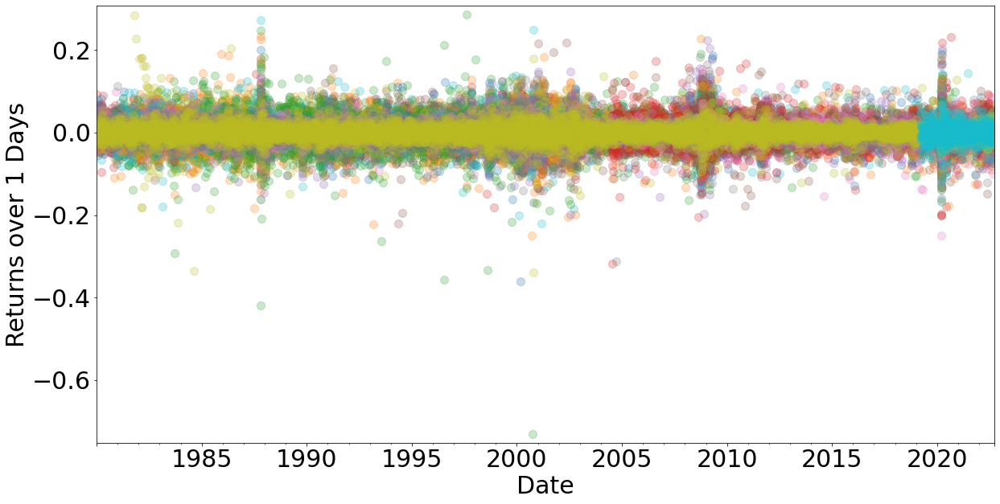

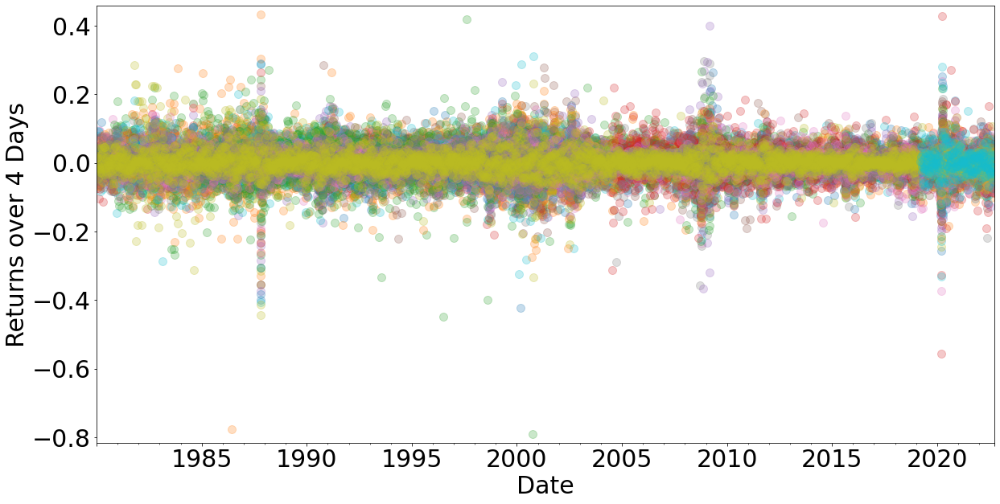

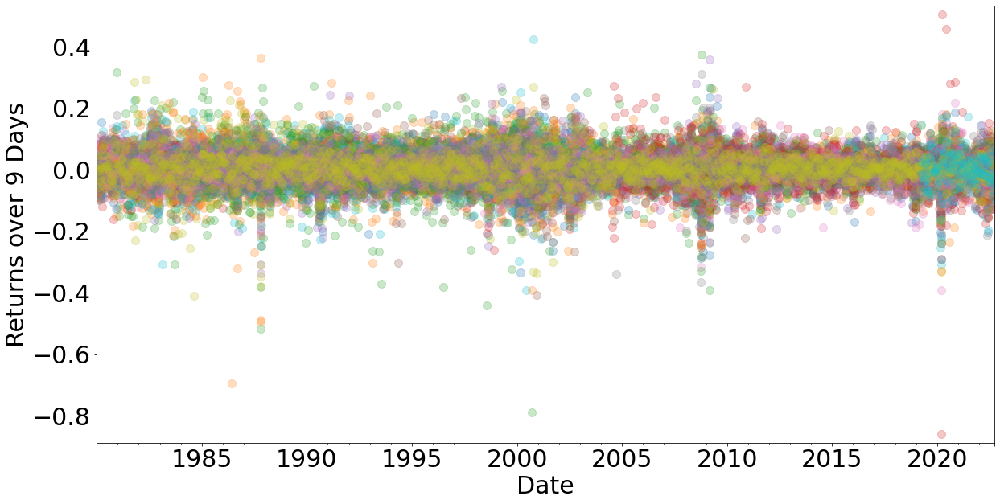

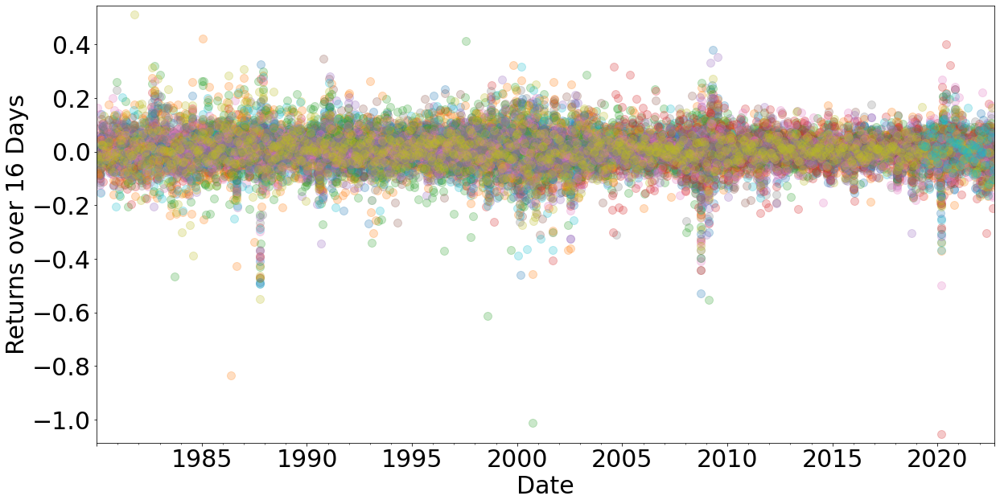

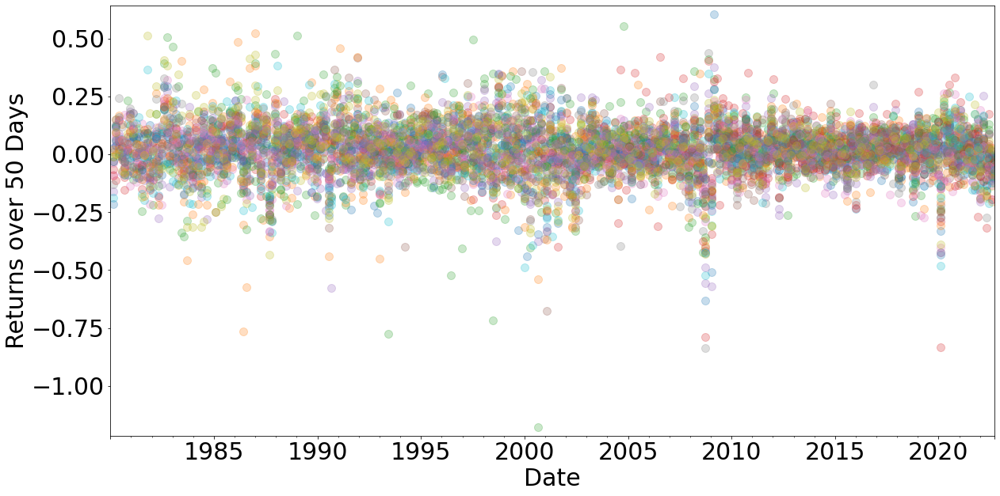

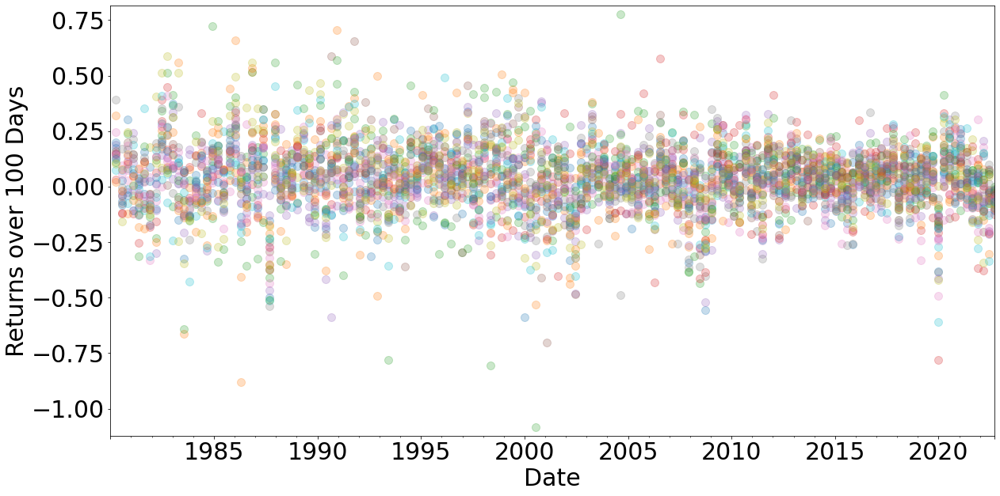

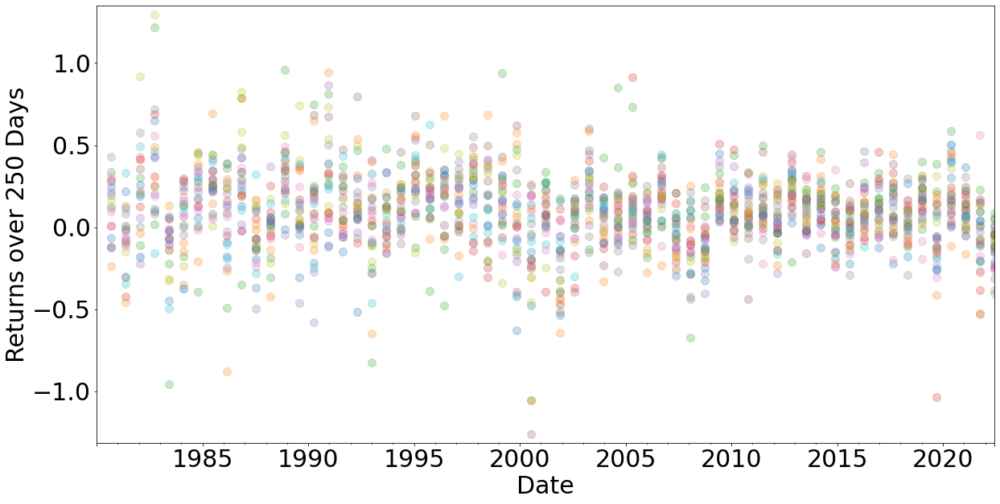

In [3]:

diff_lengths = [1,4,9,16, 50, 100, 250]
regs = {}
lag_sig = {}
r2 = {}
for diff_len in diff_lengths:
    lag_length = 1
    data = {"Log": np.log(orig_data).resample(str(diff_len) + "D").last()}
    data["Diff"] = data["Log"].diff()
    regs[diff_len] = {}
    label = "Returns over " + str(diff_len) + " Days"
    plt.rcParams['axes.ymargin'] = 0.02
    plt.rcParams['axes.xmargin'] = 0
    plt.rcParams.update({'font.size': 30})
    fig, ax = plt.subplots(figsize = (20,10))
    data["Diff"].plot(legend = False, ls = "", marker = "o", 
                      markersize = 10, alpha = .25, ax = ax)
#     plt.legend(ncol = 3)
    ax.set_ylabel(label)
    
    lags = 1

    for log_diff in data.keys():
        regs[diff_len][log_diff] = {}

        for stock in tickers:
            regs[diff_len][log_diff][stock] = {}
            formula = stock + " ~ " 
            formula = formula + stock + ".shift(" + str(1) + ")"
            regs[diff_len][log_diff][stock]["Regression"] = smf.ols(formula = formula,
                                             data = data[log_diff][[stock]].dropna())
            regs[diff_len][log_diff][stock]["Results"] = regs[diff_len][log_diff][stock]["Regression"].fit()
#             print(OLS_summary(regs[diff_len][log_diff][stock]["Results"]))

            
      

### Consildate the significance of the lagged terms and the $r^2$ values from each regression

In [4]:
sig_vals = {d:{stock:regs[d]["Diff"][stock]["Results"].pvalues.iloc[1] for stock in tickers} for d in diff_lengths}
t_vals = {d:{stock:regs[d]["Diff"][stock]["Results"].tvalues.iloc[1] for stock in tickers} for d in diff_lengths}
r2 = {d:{stock:regs[d]["Diff"][stock]["Results"].rsquared_adj for stock in tickers} for d in diff_lengths}
beta_estimates = {d:{stock:regs[d]["Diff"][stock]["Results"].params.iloc[1] for stock in tickers} for d in diff_lengths}

Text(0.5, 1.0, 't-values of lag')

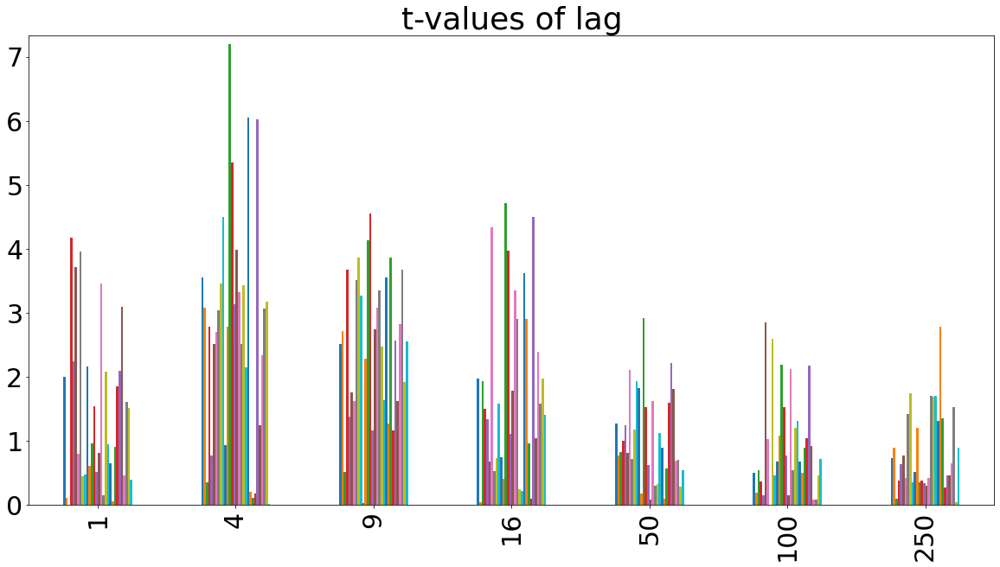

In [5]:
t_vals_df = pd.DataFrame(t_vals).T.round(2)
fig, ax = plt.subplots(figsize = (20,10))
abs(t_vals_df).plot.bar(legend = False, ax = ax)
ax.set_title("t-values of lag")

C:\Users\JLCat\AppData\Local\Temp\ipykernel_16344\3364910503.py:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([str(int(y)) + "%" for y in ax.get_yticks()])


[Text(0, 0.0, '0%'),
 Text(0, 20.0, '20%'),
 Text(0, 40.0, '40%'),
 Text(0, 60.0, '60%'),
 Text(0, 80.0, '80%'),
 Text(0, 100.0, '100%')]

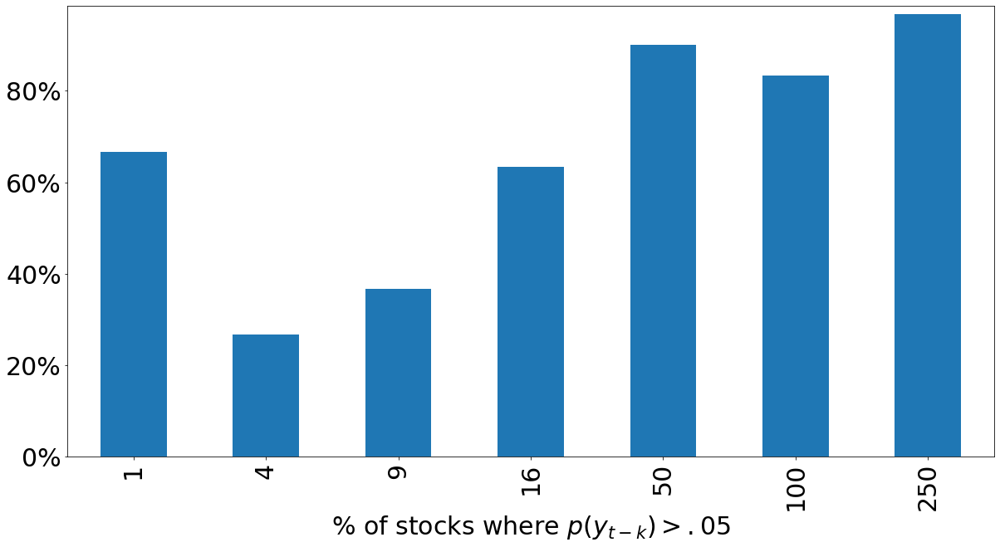

In [6]:
sig_df = pd.DataFrame(sig_vals).T
percent_sig = (sig_df[sig_df>.05]).count(axis = 1).div(len(sig_df.keys())).mul(100).round(2)
percent_sig.index.name = "% of stocks where $p(y_{t-k}) > .05$"
fig, ax = plt.subplots(figsize = (20,10))
percent_sig.plot.bar(legend = False, ax = ax)
ax.set_yticklabels([str(int(y)) + "%" for y in ax.get_yticks()])

In [7]:
sig_df

,AXP,AMGN,AAPL,BA,CAT,CSCO,CVX,GS,HD,HON,...,PG,TRV,UNH,CRM,VZ,V,WBA,WMT,DIS,DOW
% of stocks where $p(y_{t-k}) > .05$,,,,,,,,,,,,,,,,,,,,,
1,0.045471,0.901746,0.995679,0.000030,0.024437,0.000210,0.426151,0.000076,0.654222,0.631262,...,5.181130e-01,0.949511,0.362388,0.064698,3.537104e-02,0.001925,0.634870,0.107915,0.129616,0.687393
4,0.000380,0.002052,0.716273,0.005354,0.442273,0.011730,0.006680,0.002373,0.000545,0.000007,...,1.577755e-09,0.835230,0.912708,0.854400,1.887534e-09,0.211573,0.019557,0.002129,0.001466,0.987047
9,0.011841,0.006541,0.602210,0.000245,0.169091,0.078030,0.105441,0.000450,0.000117,0.001091,...,3.749254e-04,0.204537,0.000115,0.246021,1.022092e-02,0.102876,0.004709,0.000254,0.054776,0.011464
16,0.049416,0.957980,0.053137,0.135073,0.180986,0.498500,0.000017,0.595091,0.458695,0.114571,...,3.084808e-04,0.003761,0.330741,0.919332,7.718090e-06,0.297545,0.016959,0.111951,0.049169,0.162490
50,0.205227,0.438563,0.405519,0.319917,0.213715,0.410686,0.036094,0.471733,0.237896,0.053443,...,3.688580e-01,0.920381,0.568184,0.112972,2.713302e-02,0.072264,0.492043,0.475296,0.770786,0.590888
100,0.611411,0.843879,0.587707,0.711775,0.881039,0.005242,0.304234,0.993109,0.010475,0.645054,...,4.994980e-01,0.609133,0.373578,0.302557,3.112621e-02,0.361466,0.935774,0.938163,0.644321,0.485745
250,0.468662,0.369528,0.923781,0.702812,0.526384,0.442682,0.675124,0.166824,0.084839,0.720329,...,1.969548e-01,0.007051,0.181802,0.785537,6.488930e-01,0.651541,0.517272,0.132048,0.967482,0.461101


### In long-run, growth rate of stock price tends to return closer to trend

Text(0.5, 0, 'Lag Length')

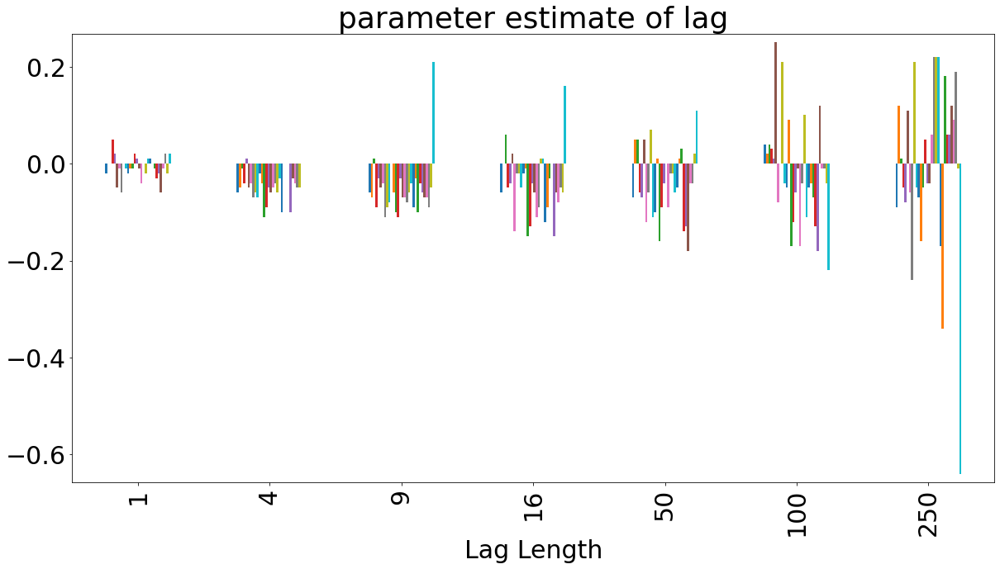

In [8]:
fig, ax = plt.subplots(figsize = (20,10))
pd.DataFrame(beta_estimates).T.round(2).plot.bar(legend = False, ax = ax)
ax.set_title("parameter estimate of lag")
ax.set_xlabel("Lag Length")

Text(0.5, 0, 'Lag Length')

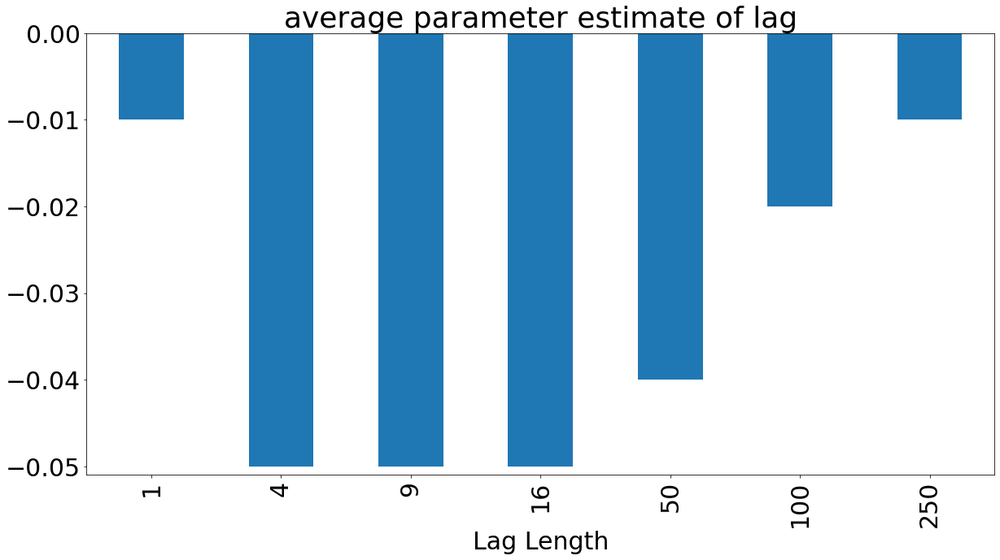

In [9]:
fig, ax = plt.subplots(figsize = (20,10))
pd.DataFrame(beta_estimates).T.mean(axis = 1).round(2).plot.bar(legend = False, ax = ax)
ax.set_title("average parameter estimate of lag")
ax.set_xlabel("Lag Length")

Text(0.5, 0, 'Lag Length')

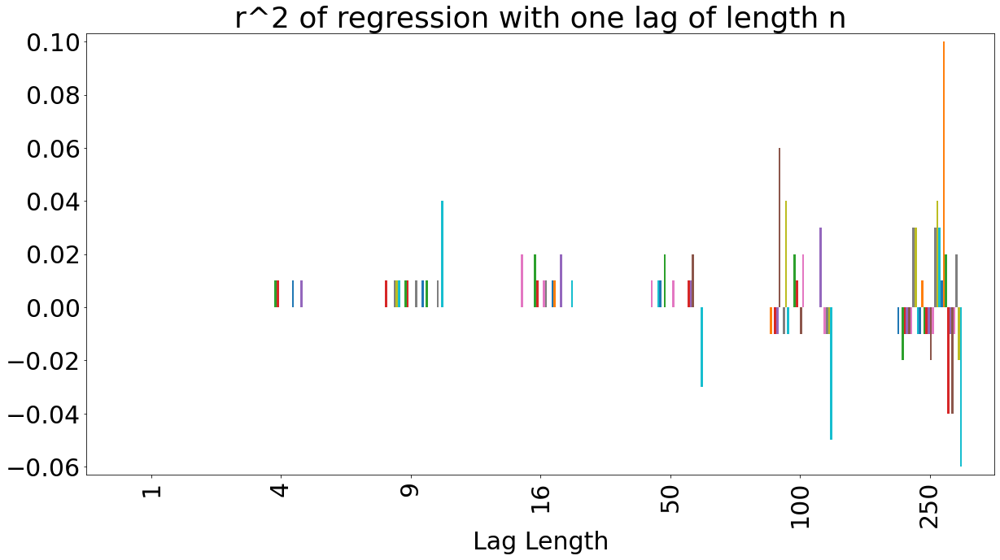

In [10]:
fig, ax = plt.subplots(figsize = (20,10))
pd.DataFrame(r2).T.round(2).plot.bar(legend = False, ax = ax)
ax.set_title("r^2 of regression with one lag of length n")
ax.set_xlabel("Lag Length")

Text(0.5, 0, 'Lag Length')

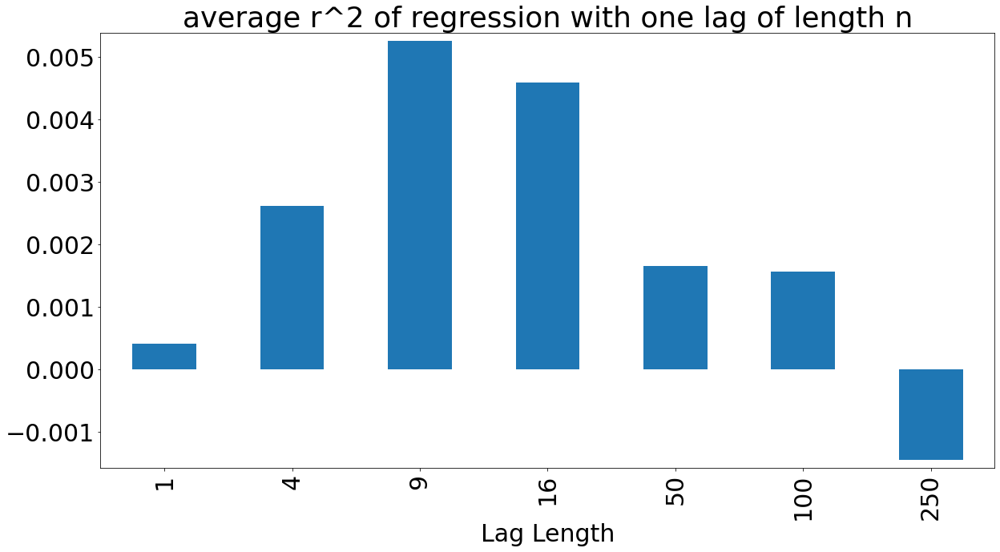

In [11]:
fig, ax = plt.subplots(figsize = (20,10))
pd.DataFrame(r2).T.mean(axis = 1).plot.bar(legend = False, ax = ax)
ax.set_title("average r^2 of regression with one lag of length n")
ax.set_xlabel("Lag Length")

# 2. Retesting EMH without setting frequency of data equal to $k$, the length of the difference and lag.

For the following, y indicates log-differenced data of stock prices. I have selected MSFT, but results are similar across stocks.

$y_t = f(y_{t-k})$ where $k$ is number of periods that data is differenced.

$y_t = \beta_0 + \beta_1 y_{t-k} + \epsilon_t$ 

To check if error is autocorrelated, regress error term on itself using a lag length equal to the length of the difference.

$\epsilon_t = \gamma\epsilon_{t-k} + \nu_t$ 

Is this okay? Here is the distribution of t-values for the lagged residual term from regression of the residual regressed on a lag of $k$ periods. 

Are you familiar with this sort of approach? I believe that this cannot be subject to a critique that the residual is autocorrelated since the appropriate measure to use in checking for autocorrelation of the error term should be the length of the difference (which is the same as the length of the lag).

Below are results for each lag length. All residuals, including neighboring residuals, defined by $t$, $t+1$ where $1 < k$, meaning that neighboring error terms are separated by a period that is less than the length of the difference and lag.

### Error Term is Autocorrelated if $t+1 < k$ but not if lag = diff_len


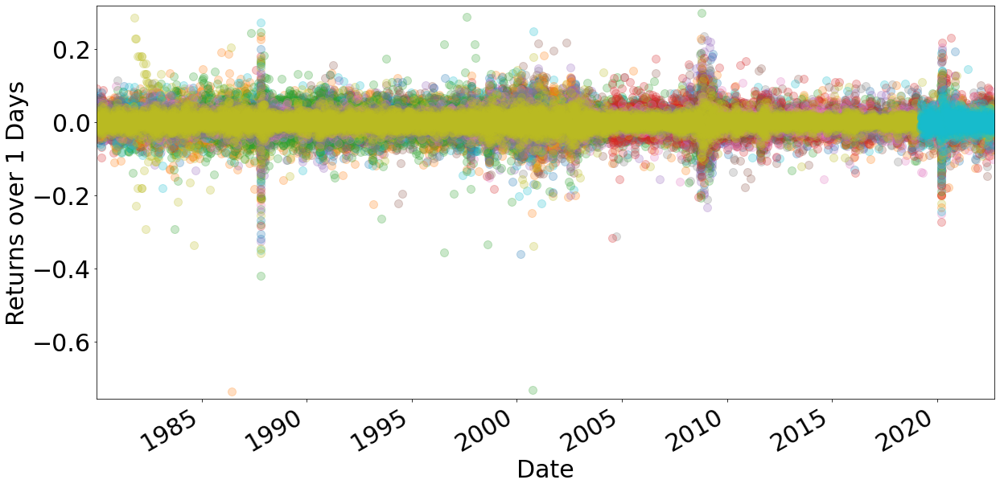

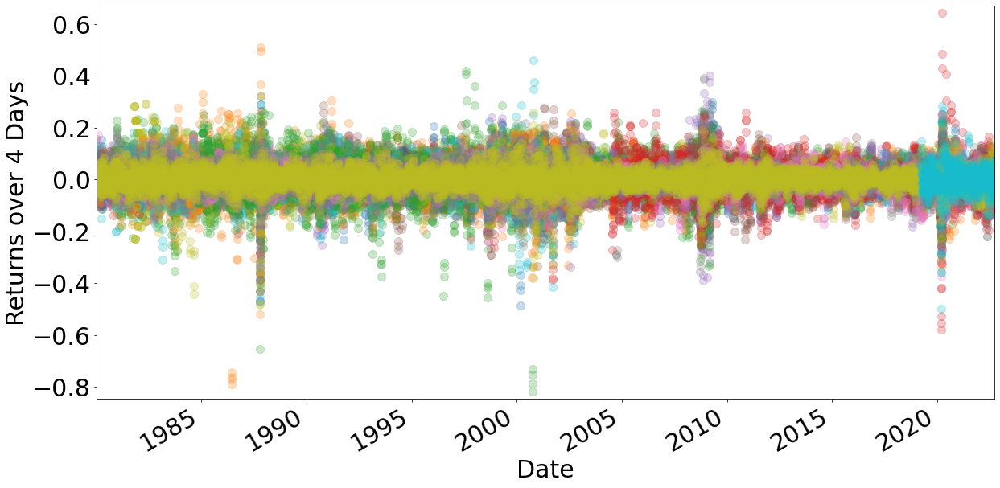

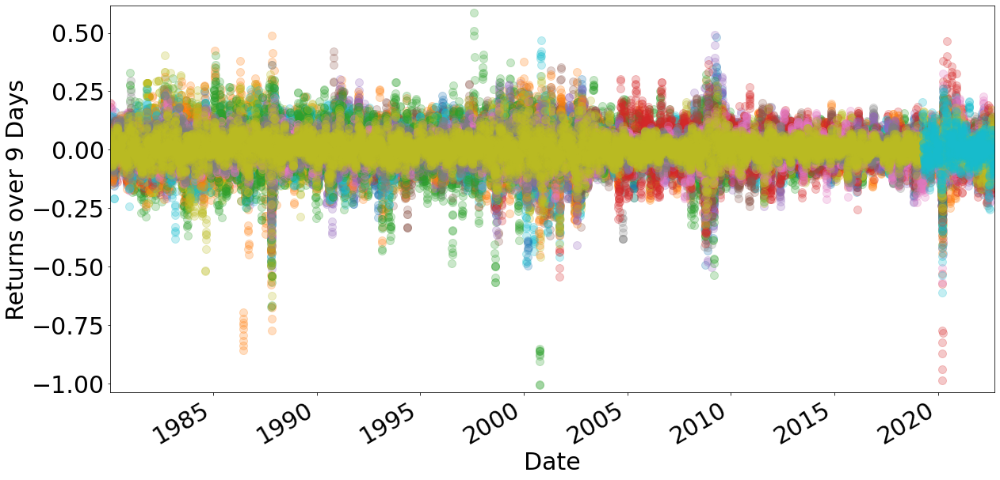

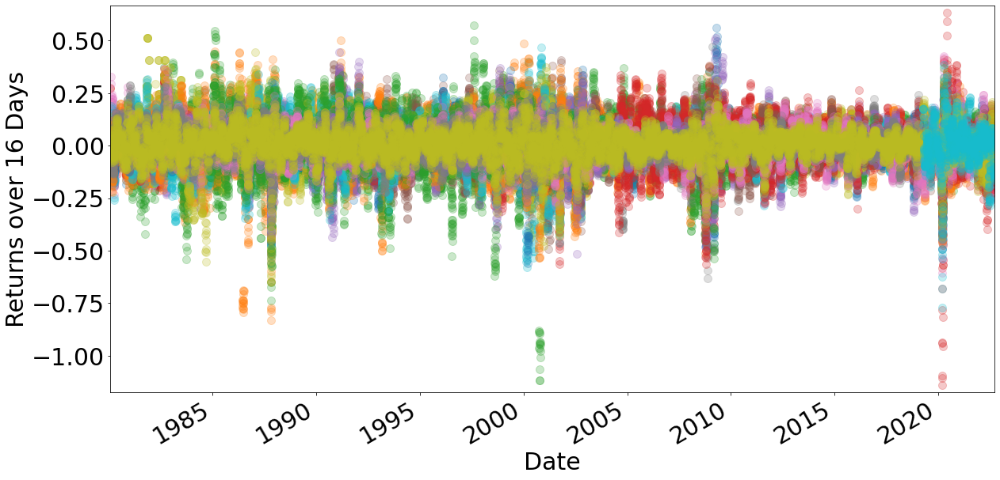

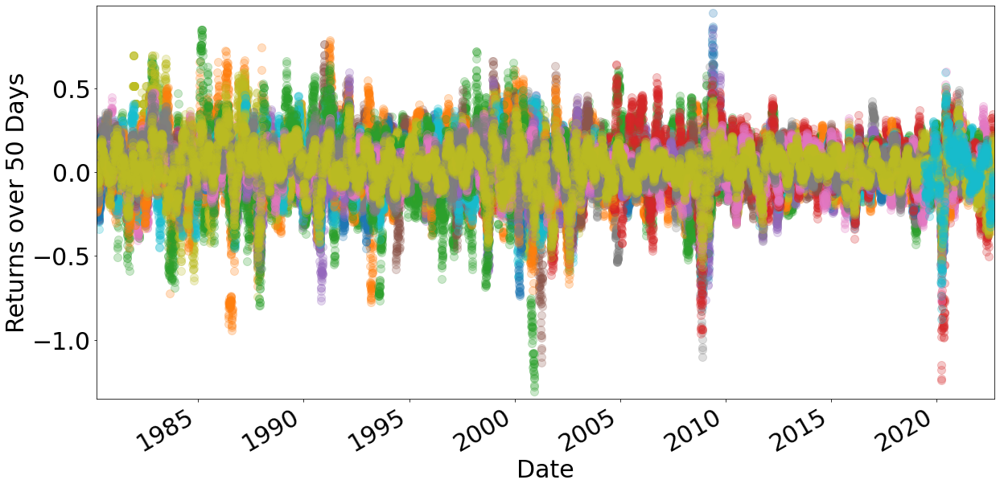

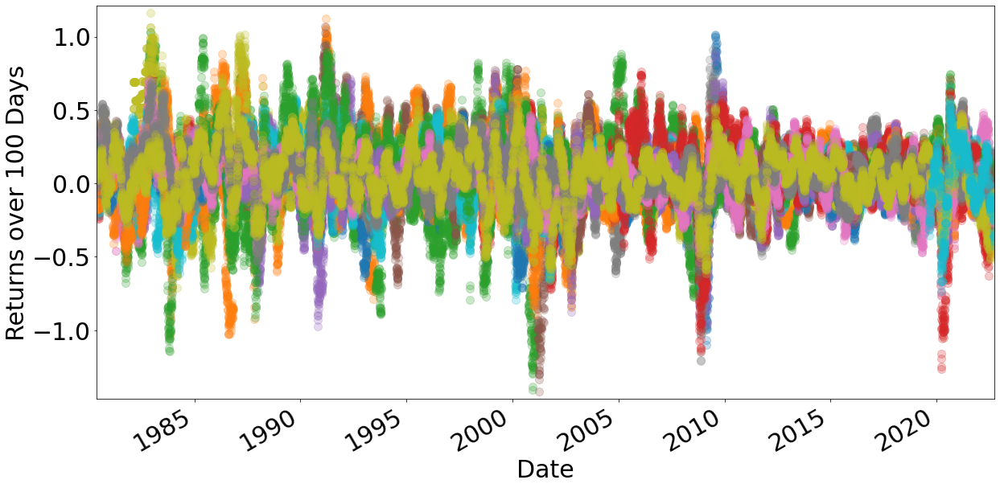

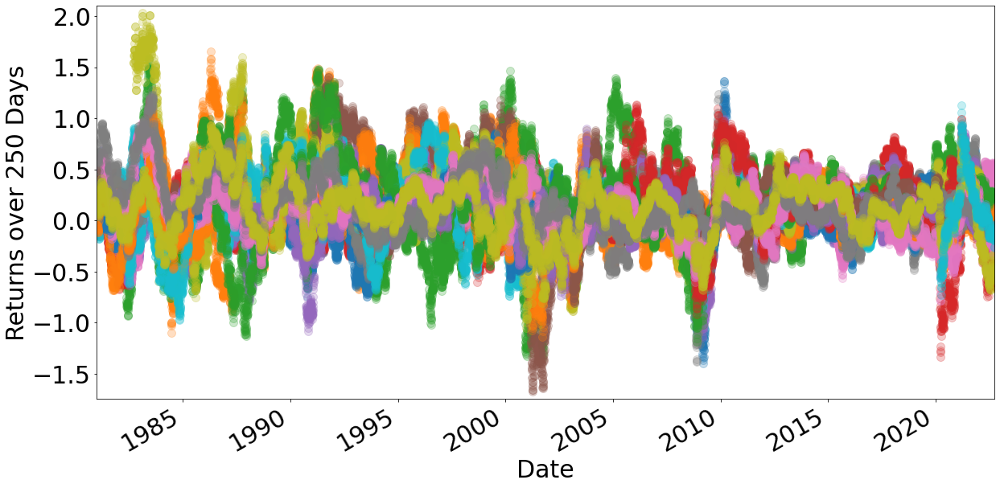

In [12]:

diff_lengths = [1,4,9,16, 50, 100, 250]
regs = {}
lag_sig = {}
r2 = {}
for diff_len in diff_lengths:
    lag_length = 1
    data = {"Log": np.log(orig_data)}
    data["Diff"] = data["Log"].diff(diff_len)
    regs[diff_len] = {}
    label = "Returns over " + str(diff_len) + " Days"
    plt.rcParams['axes.ymargin'] = 0.02
    plt.rcParams['axes.xmargin'] = 0
    plt.rcParams.update({'font.size': 30})
    fig, ax = plt.subplots(figsize = (20,10))
    data["Diff"].plot(legend = False, ls = "", marker = "o", 
                      markersize = 10, alpha = .25, ax = ax)
#     plt.legend(ncol = 3)
    ax.set_ylabel(label)
    
    lags = 1

    for log_diff in data.keys():
        regs[diff_len][log_diff] = {}

        for stock in tickers:
            regs[diff_len][log_diff][stock] = {}
            formula = stock + " ~ " 
            formula = formula + stock + ".shift(" + str(diff_len) + ")"
            regs[diff_len][log_diff][stock]["Regression"] = smf.ols(formula = formula,
                                             data = data[log_diff][[stock]].dropna())
            regs[diff_len][log_diff][stock]["Results"] = regs[diff_len][log_diff][stock]["Regression"].fit()
#             print(OLS_summary(regs[diff_len][log_diff][stock]["Results"]))

            
      

In [13]:
sig_vals = {d:{stock:regs[d]["Diff"][stock]["Results"].pvalues.iloc[1] for stock in tickers} for d in diff_lengths}
t_vals = {d:{stock:regs[d]["Diff"][stock]["Results"].tvalues.iloc[1] for stock in tickers} for d in diff_lengths}
r2 = {d:{stock:regs[d]["Diff"][stock]["Results"].rsquared_adj for stock in tickers} for d in diff_lengths}
beta_estimates = {d:{stock:regs[d]["Diff"][stock]["Results"].params.iloc[1] for stock in tickers} for d in diff_lengths}

Text(0.5, 1.0, 't-values of lag')

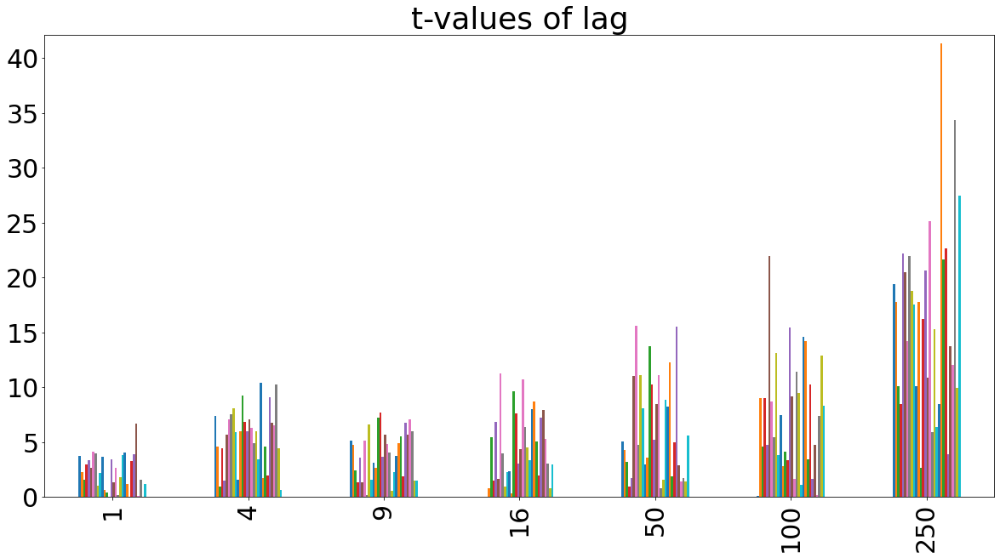

In [14]:
t_vals_df = pd.DataFrame(t_vals).T.round(2)
fig, ax = plt.subplots(figsize = (20,10))
abs(t_vals_df).plot.bar(legend = False, ax = ax)
ax.set_title("t-values of lag")

C:\Users\JLCat\AppData\Local\Temp\ipykernel_16344\2590198855.py:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([str(int(y)) + "%" for y in ax.get_yticks()])


[Text(0, 0.0, '0%'),
 Text(0, 10.0, '10%'),
 Text(0, 20.0, '20%'),
 Text(0, 30.0, '30%'),
 Text(0, 40.0, '40%'),
 Text(0, 50.0, '50%')]

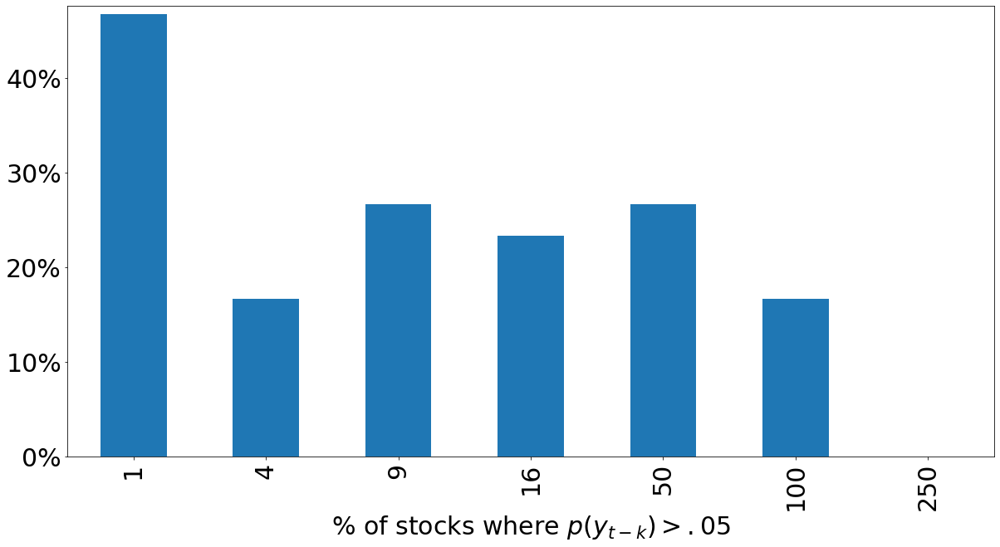

In [15]:
sig_df = pd.DataFrame(sig_vals).T
percent_sig = (sig_df[sig_df>.05]).count(axis = 1).div(len(sig_df.keys())).mul(100).round(2).dropna()
percent_sig.index.name = "% of stocks where $p(y_{t-k}) > .05$"
fig, ax = plt.subplots(figsize = (20,10))
percent_sig.plot.bar(legend = False, ax = ax)
ax.set_yticklabels([str(int(y)) + "%" for y in ax.get_yticks()])

In [16]:
sig_df.T

,1,4,9,16,50,100,250
AXP,1.543112e-04,1.779918e-13,2.796926e-07,9.968643e-01,3.960638e-07,9.186995e-01,1.127042e-82
AMGN,2.066778e-02,4.721111e-06,1.617022e-06,4.406749e-01,2.066046e-05,2.447225e-19,1.304135e-69
AAPL,1.063447e-01,3.549471e-01,1.506071e-02,5.547452e-08,1.367910e-03,4.248284e-06,4.607831e-24
BA,3.312756e-03,9.142132e-06,1.806058e-01,1.249040e-01,3.372038e-01,1.717349e-19,3.426109e-17
CAT,7.630106e-04,1.373753e-01,3.210578e-04,7.511145e-12,8.075958e-02,1.882364e-06,7.160634e-107
CSCO,6.980025e-03,1.125503e-08,1.734440e-01,9.234827e-02,4.322734e-28,9.503229e-104,1.030383e-90
CVX,4.011405e-05,1.484255e-12,2.935004e-07,1.741111e-29,3.321587e-54,3.199525e-18,1.264676e-45
GS,5.849808e-05,4.288397e-14,8.700257e-01,7.513195e-05,2.237676e-06,5.307957e-08,1.926863e-102
HD,2.852967e-01,7.998689e-16,4.721916e-11,3.524306e-01,1.512347e-28,2.710341e-39,1.921035e-77
HON,2.695447e-02,3.869314e-09,1.179499e-01,2.337404e-02,4.581097e-16,1.329096e-04,3.303239e-68


Text(0.5, 0, 'Lag Length')

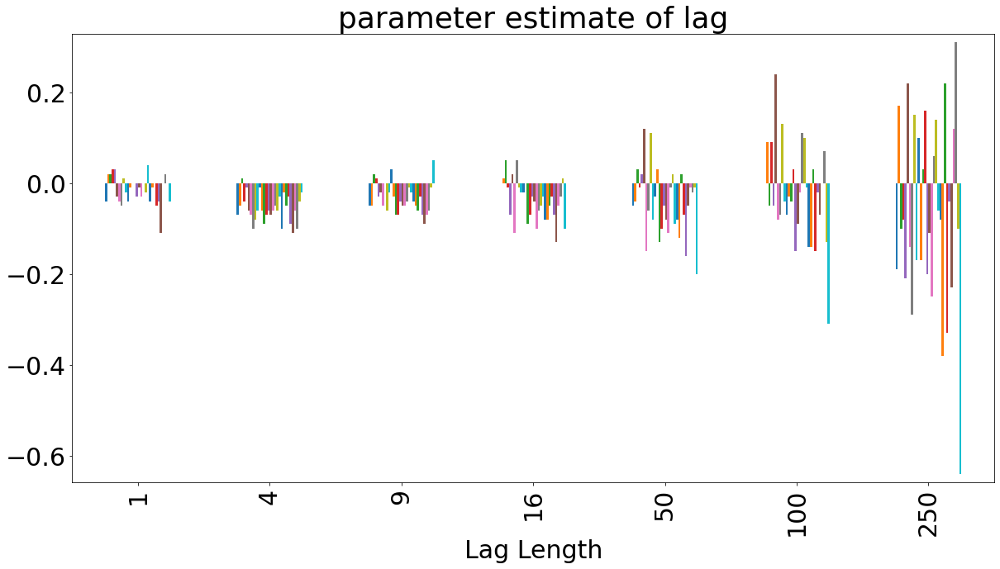

In [17]:
fig, ax = plt.subplots(figsize = (20,10))
pd.DataFrame(beta_estimates).T.round(2).plot.bar(legend = False, ax = ax)
ax.set_title("parameter estimate of lag")
ax.set_xlabel("Lag Length")

Text(0.5, 0, 'Lag Length')

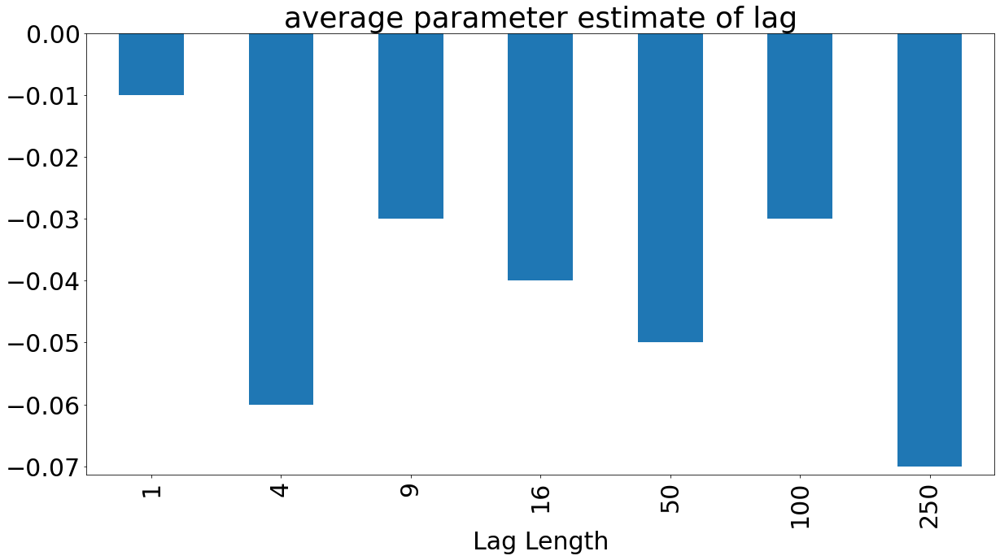

In [18]:
fig, ax = plt.subplots(figsize = (20,10))
pd.DataFrame(beta_estimates).T.mean(axis = 1).round(2).plot.bar(legend = False, ax = ax)
ax.set_title("average parameter estimate of lag")
ax.set_xlabel("Lag Length")

Text(0.5, 0, 'Lag Length')

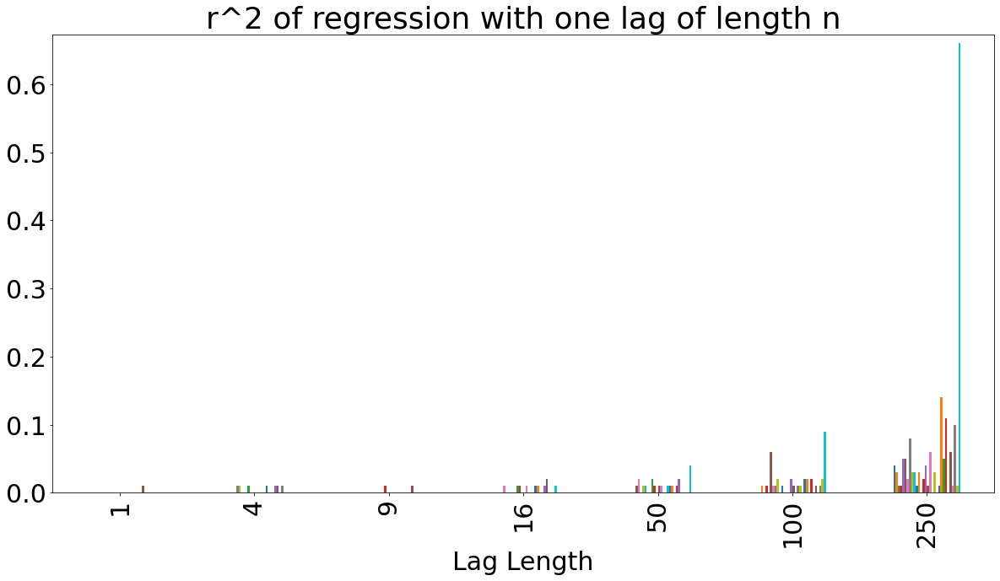

In [19]:
fig, ax = plt.subplots(figsize = (20,10))
pd.DataFrame(r2).T.round(2).plot.bar(legend = False, ax = ax)
ax.set_title("r^2 of regression with one lag of length n")
ax.set_xlabel("Lag Length")

Text(0.5, 0, 'Lag Length')

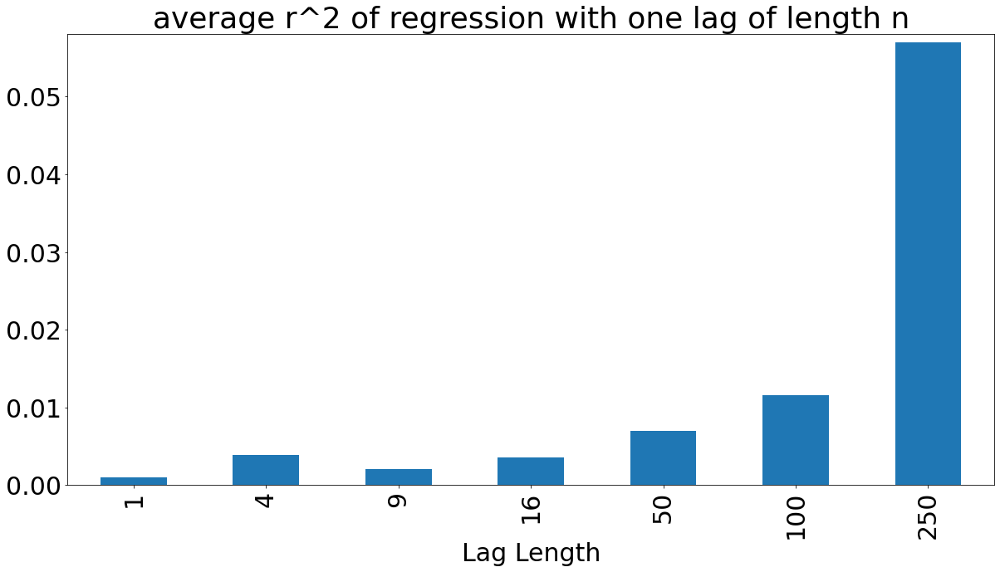

In [20]:
fig, ax = plt.subplots(figsize = (20,10))
pd.DataFrame(r2).T.mean(axis = 1).plot.bar(legend = False, ax = ax)
ax.set_title("average r^2 of regression with one lag of length n")
ax.set_xlabel("Lag Length")

# 2.1 Regression of residuals using the full set of residuals, meaning that neighboring observations are defined by ($t$, $t+1$) where $1 < k$.

$\epsilon_t = \gamma\epsilon_{t-k} + \nu_t$ 


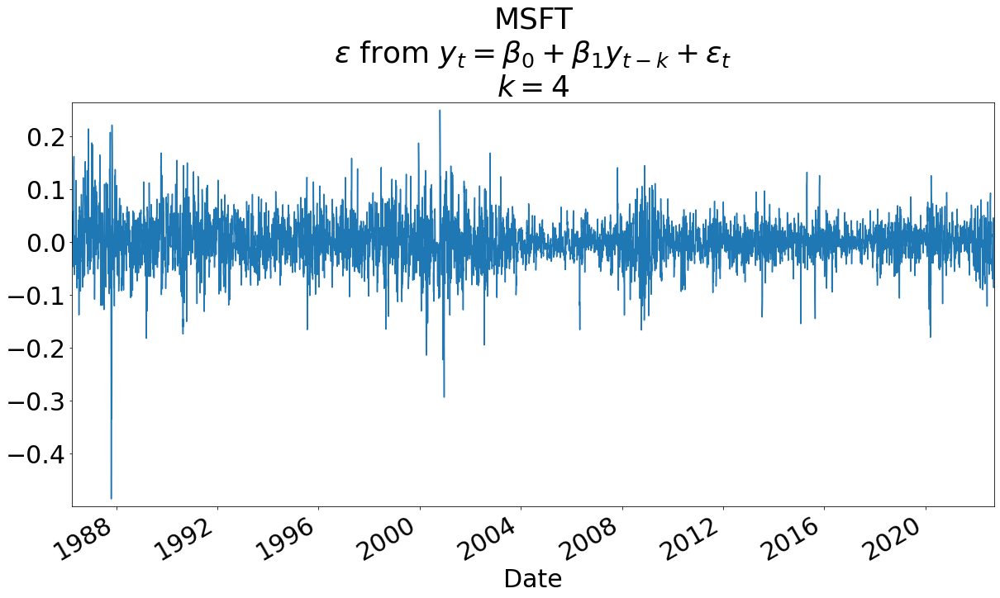

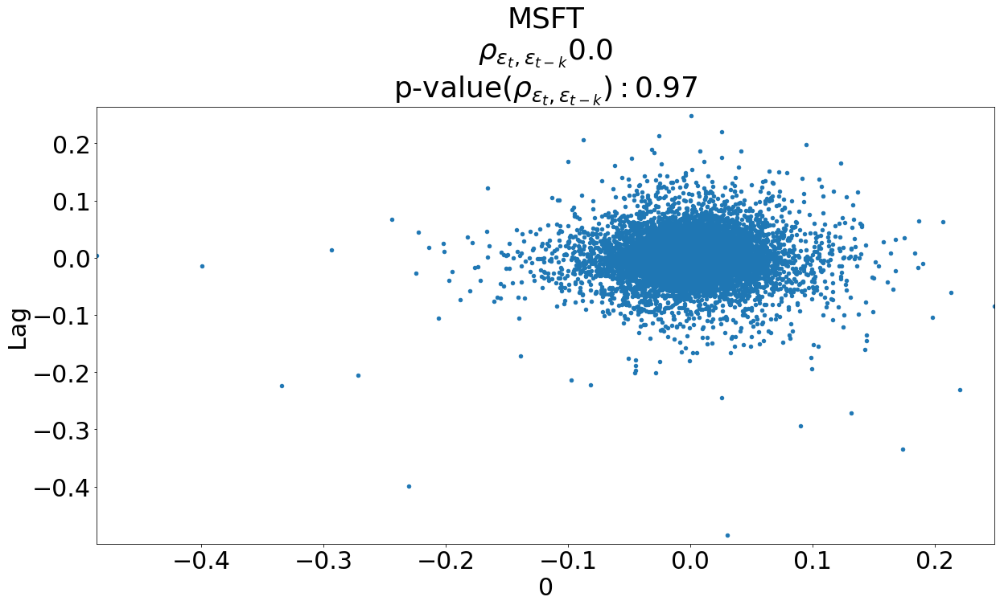

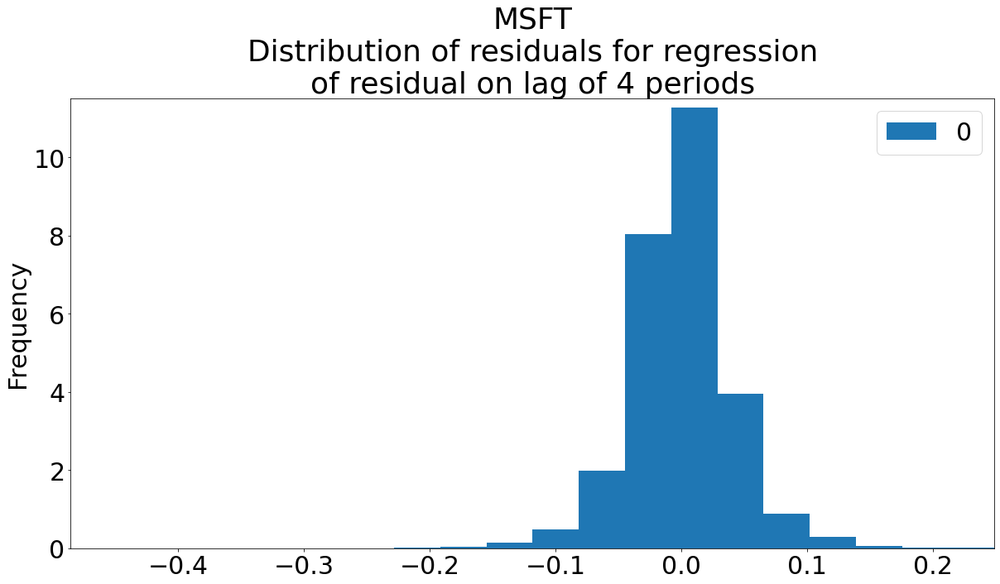

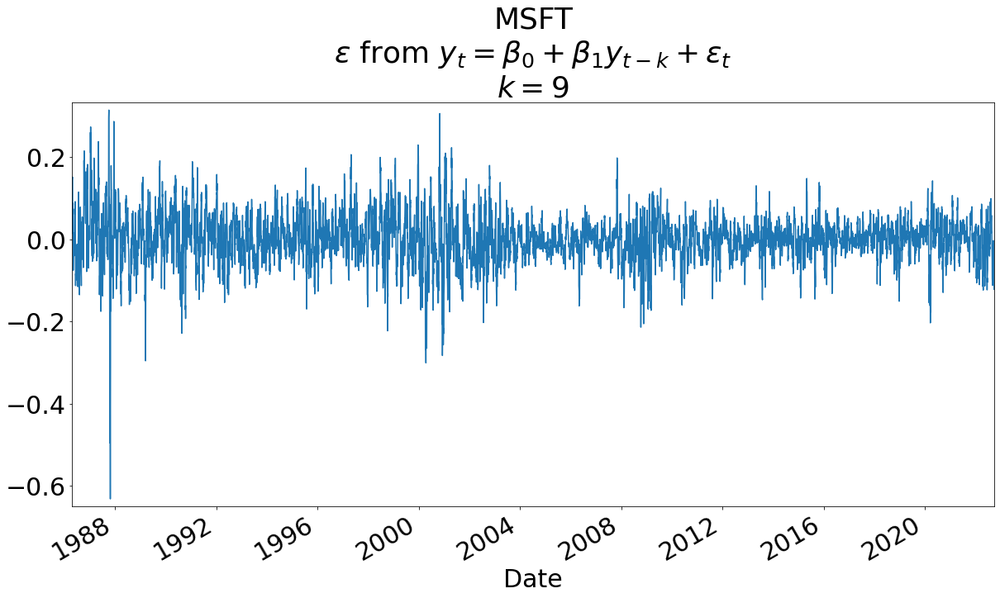

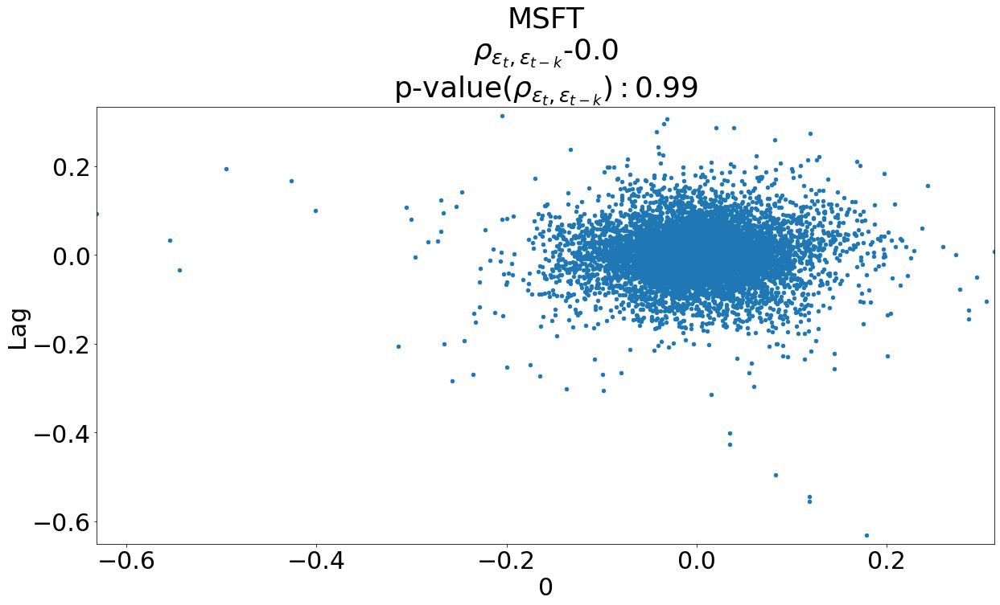

...

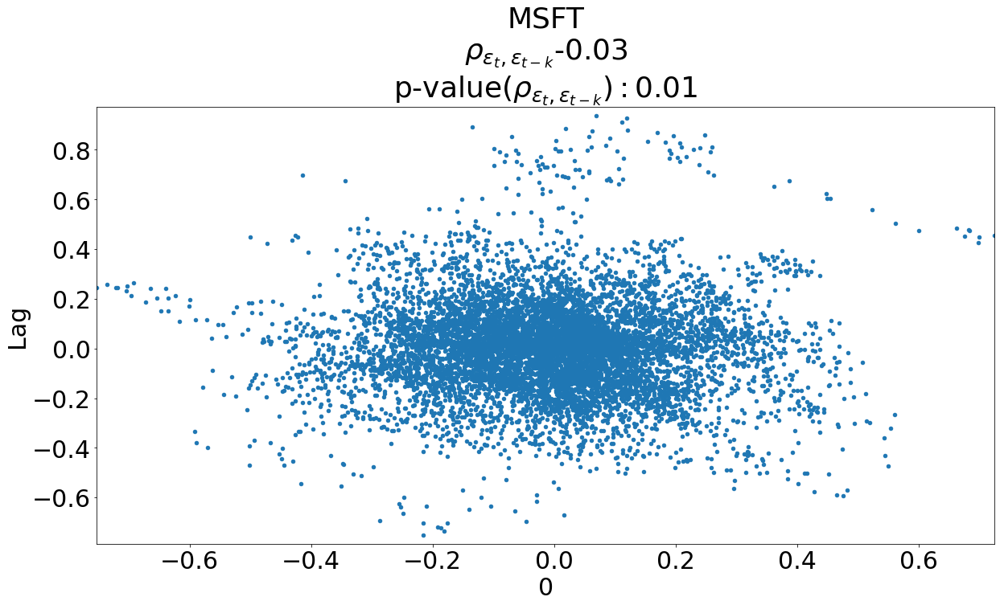

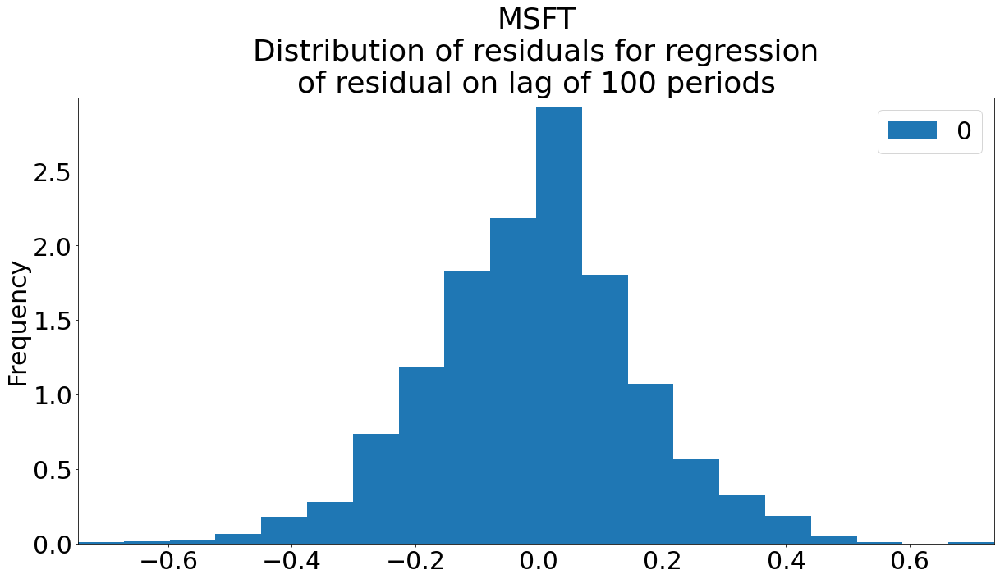

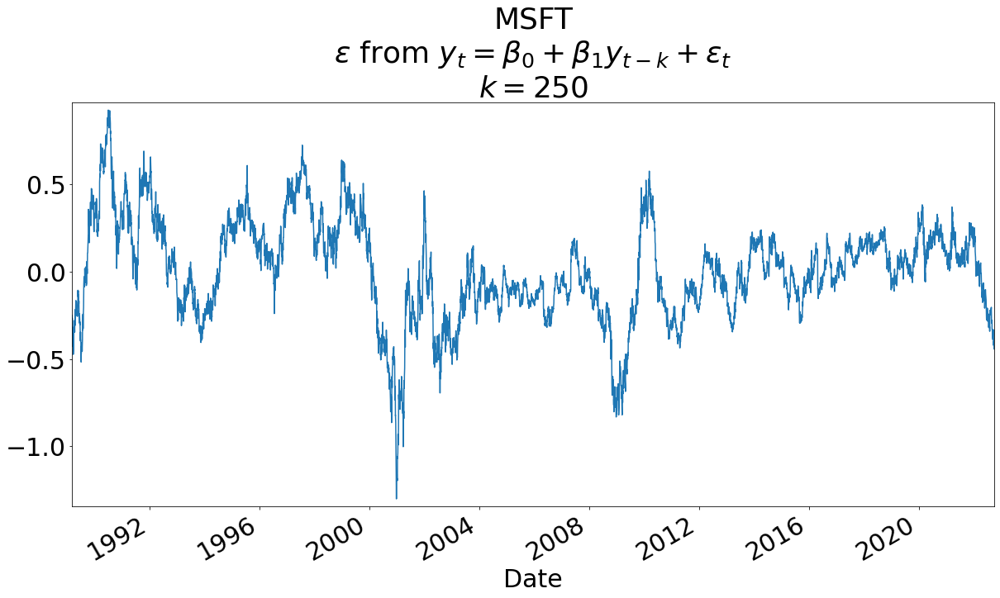

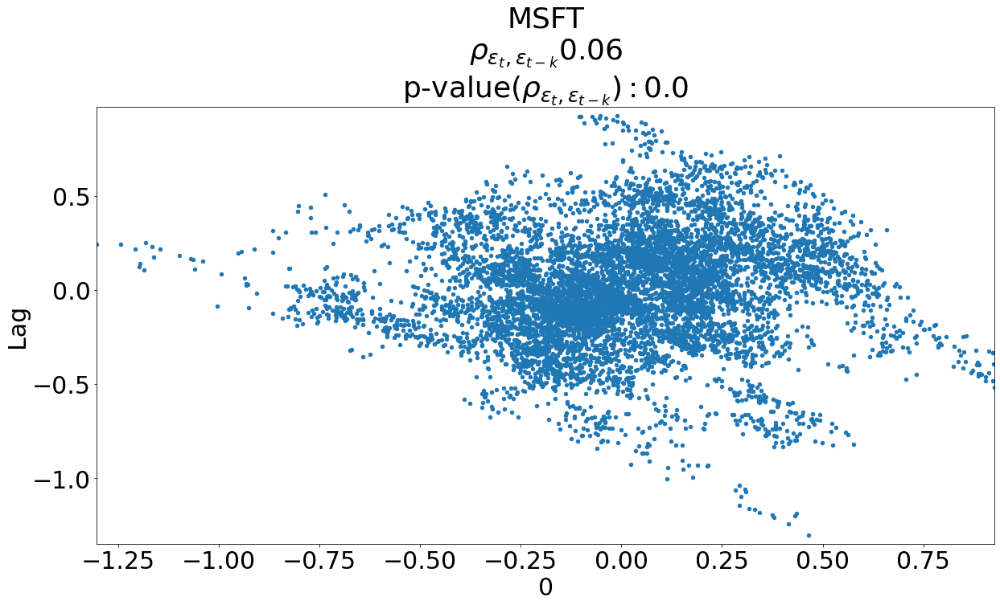

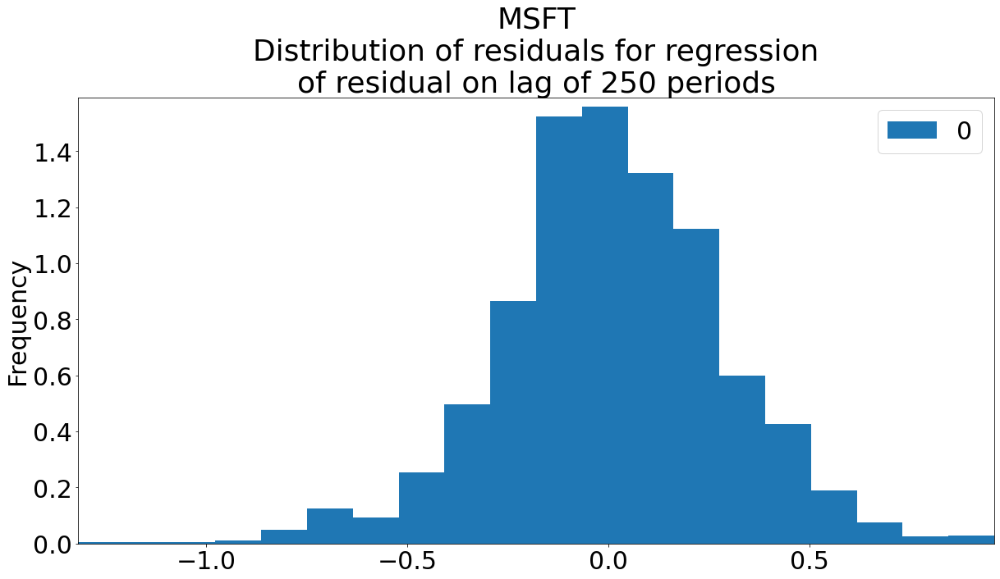

In [21]:
for lag_len in diff_lengths[1:]:
    for stock in ["MSFT"]:
        fig, ax = plt.subplots(figsize = (20,10))
        res = pd.DataFrame(regs[lag_len]["Diff"][stock]["Results"].resid)
        res["Lag"] = res[0].shift(lag_len)
        reg_df = res.dropna()
        sm.OLS(reg_df[0], reg_df["Lag"]).fit().summary()
        reg_df[0].plot.line(ax = ax)
        ax.set_title(stock +"\n$\epsilon$ from $y_t = \\beta_0 + \\beta_1 y_{t-k} + \epsilon_t$ \n$k=" + str(lag_len) + "$")
        res = pd.DataFrame(regs[lag_len]["Diff"][stock]["Results"].resid)
        res["Lag"] = res[0].shift(lag_len)
        reg_df = res.dropna()
        results = sm.OLS(reg_df[0], reg_df["Lag"]).fit()
        fig, ax = plt.subplots(figsize = (20,10))
        reg_df.plot.scatter(x = 0, y = "Lag", ax = ax)
        ax.set_title(stock +"\n$\\rho_{\epsilon_t,\epsilon_{t-k}}$" + str(reg_df.corr()[0]["Lag"].round(2)) + "\np-value($\\rho_{\epsilon_t,\epsilon_{t-k}}):$" +  str(round(results.pvalues["Lag"],2)))
        fig, ax = plt.subplots(figsize = (20,10))
        pd.DataFrame(results.resid).plot.hist(density = True, ax = ax, bins = 20)
        ax.set_title(stock +"\nDistribution of residuals for regression\nof residual on lag of " + str(lag_len) + " periods")

### In this second set, I set the frequency of residual dataframe to match the length of the difference (which is also the lag length). Thus, neighboring observations are defined by ($t$, $t+k$). The error terms are definitely randomly distributed in this case. i show the first two subdivided dataframes of frequency $k$. A full comparison would require $k$ visualizations for a given $k$.

C:\Users\JLCat\AppData\Local\Temp\ipykernel_16344\1738275462.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (20,10))


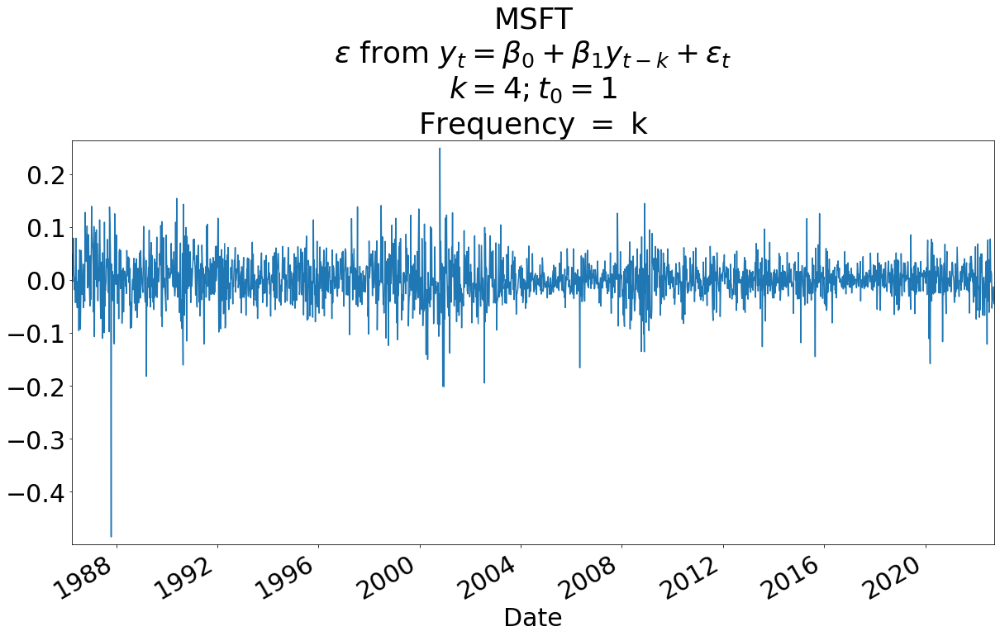

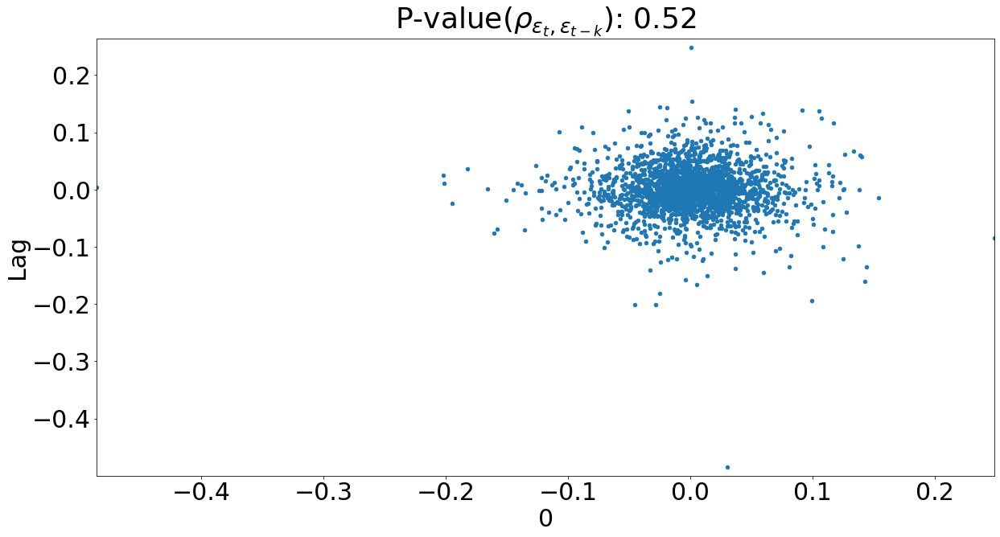

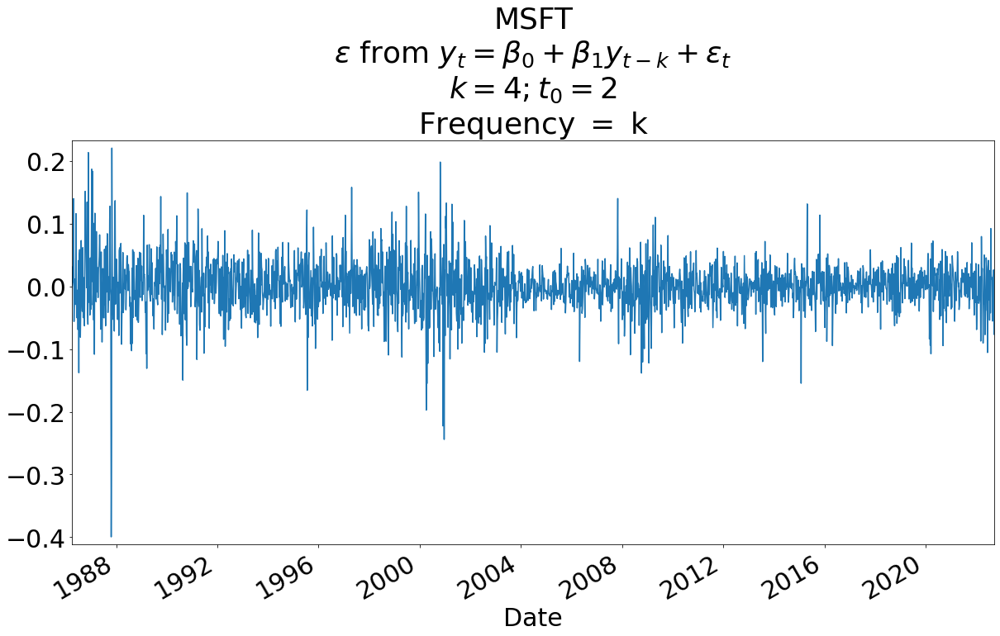

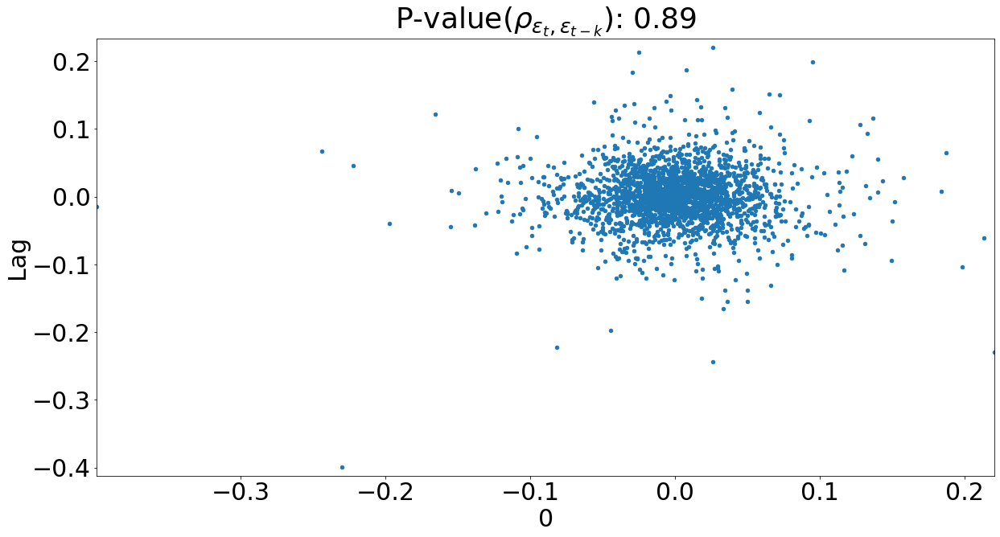

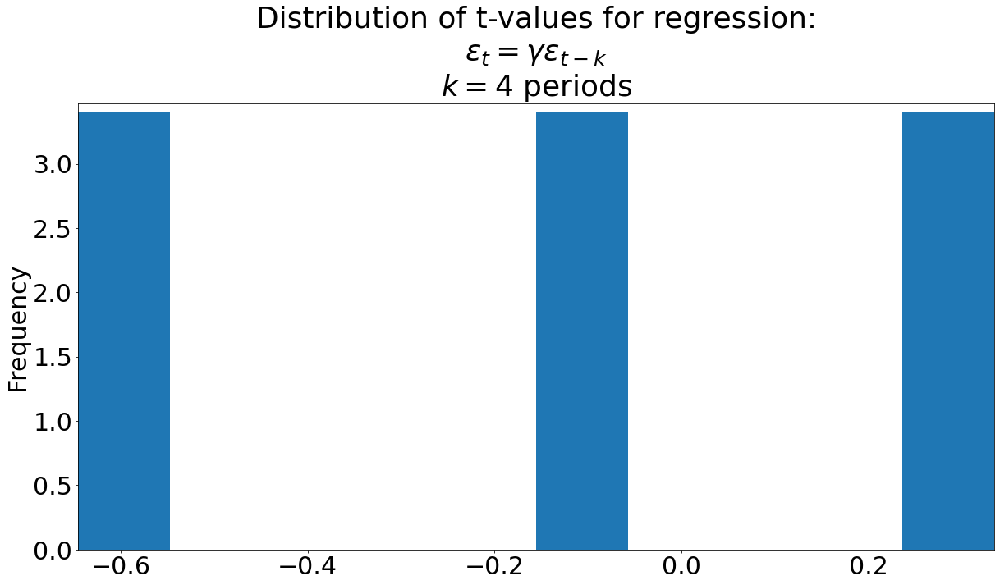

...

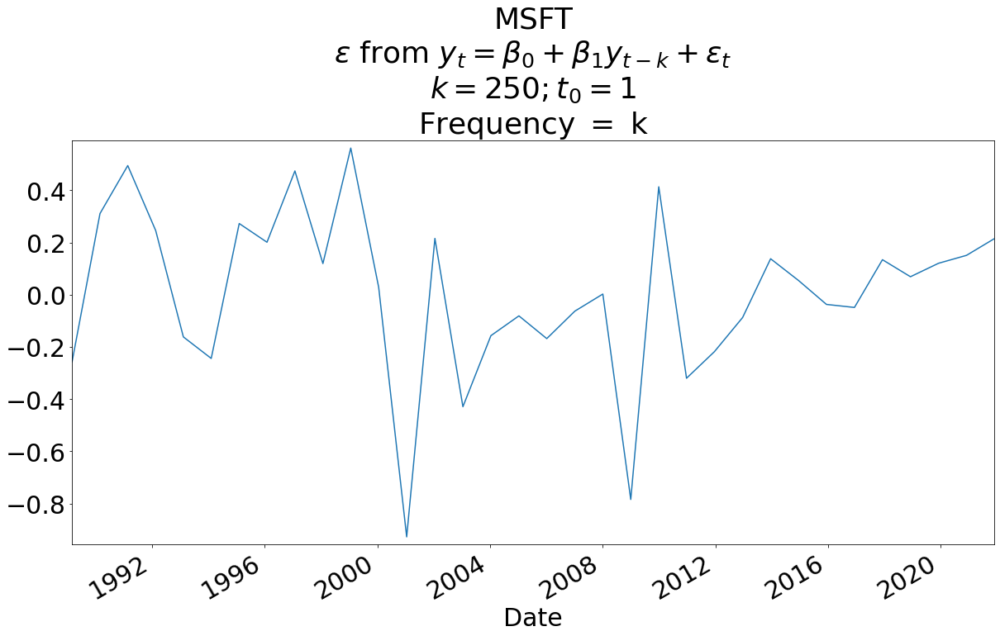

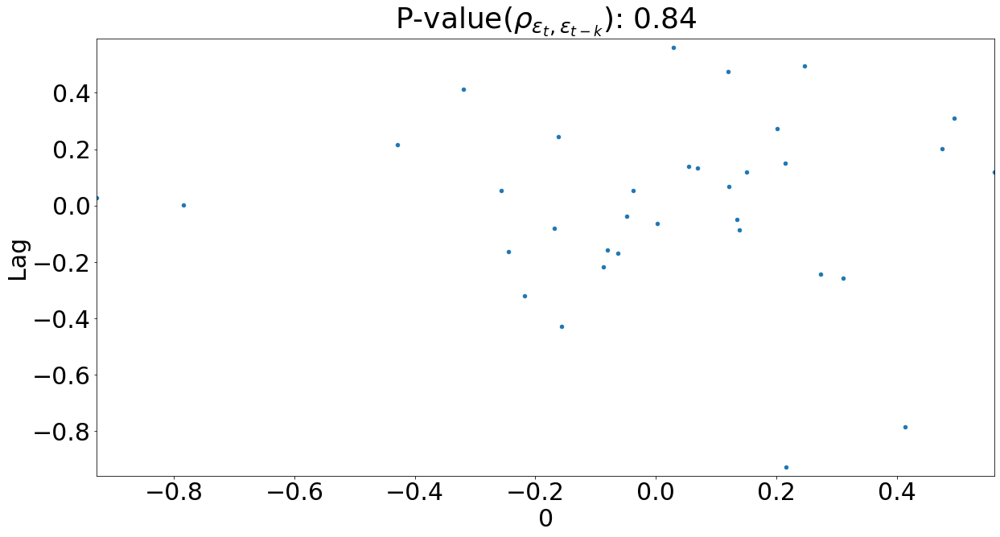

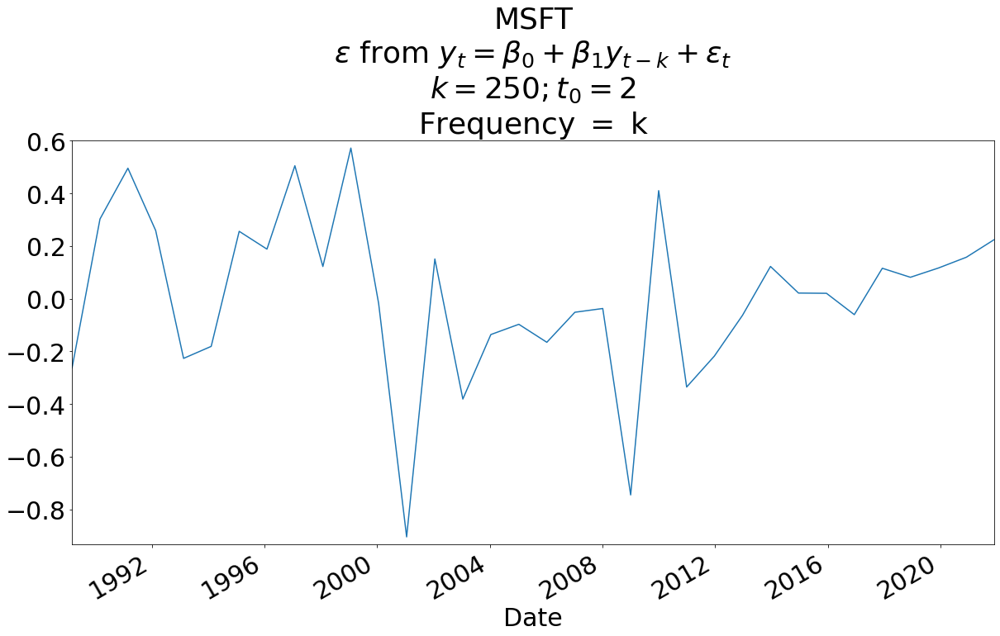

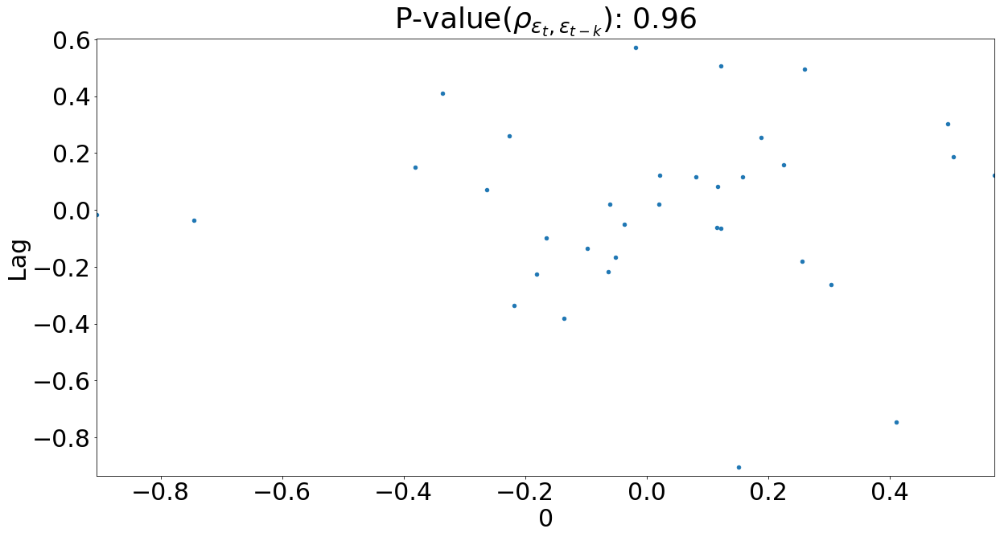

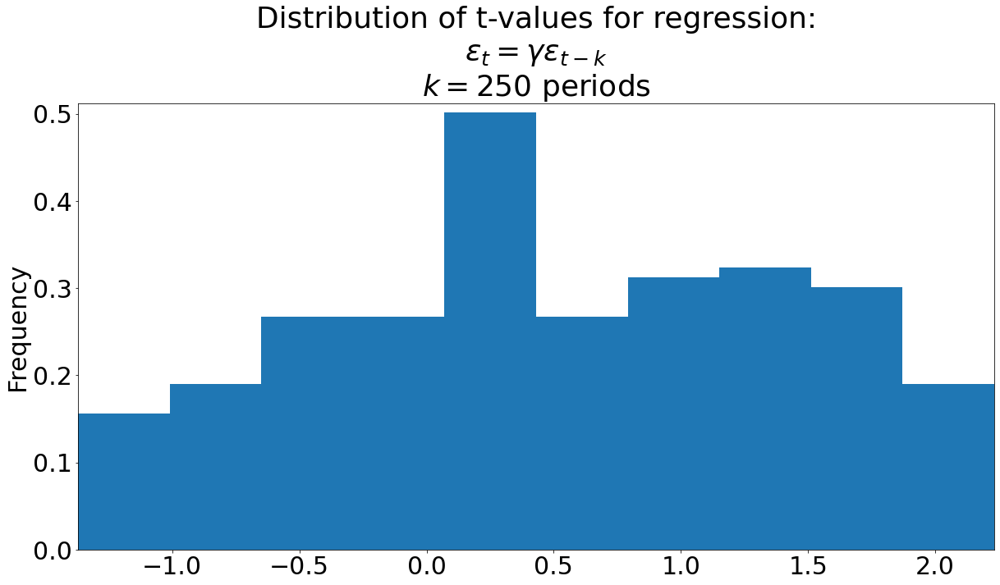

In [22]:
for lag_len in diff_lengths[1:]: 
    res = pd.DataFrame(regs[lag_len]["Diff"]["MSFT"]["Results"].resid)
    res["Lag"] = res[0].shift(lag_len)
    res_ts = []
    for i in range(1, lag_len):
        reg_df = res.dropna().iloc[i::lag_len]
        results = sm.OLS(reg_df[0], reg_df["Lag"]).fit()
        res_ts.append(results.tvalues["Lag"])
    #     print(results.summary())
        if i < 3:
            fig, ax = plt.subplots(figsize = (20,10))
            reg_df[0].plot.line(ax = ax)
            ax.set_title(stock +"\n$\epsilon$ from $y_t = \\beta_0 + \\beta_1 y_{t-k} + \epsilon_t$ \n$k=" + str(lag_len) + ";t_0=" + str(i) + "$\nFrequency $=$ k")

            fig, ax = plt.subplots(figsize = (20,10))
            reg_df.plot.scatter(x = 0, y = "Lag", ax = ax)
            ax.set_title("P-value($\\rho_{\epsilon_t,\epsilon_{t-k}}$): " + str(round(results.pvalues["Lag"], 2)))
    fig, ax = plt.subplots(figsize = (20,10))
    pd.DataFrame(res_ts).plot.hist(density = True, ax = ax, bins = 10, legend = False)
    ax.set_title("Distribution of t-values for regression:\n$\epsilon_t=\gamma \epsilon_{t-k}$\n$k=" + str(lag_len) + "$ periods")

# Tentative Conclusion

If we redefined the test of EMH so that $y_t = \beta_0 + \beta_1 y_{t-k} + \epsilon_t$, we can defend against the accusation that our error terms are autocorrelated by asserting that autocorrelation of the error term can only be meaningfully tested by comparison of $\epsilon_t$ and $\epsilon_{t+k}$. This measure is *not* autocorrelated, thus suggesting that the predictive power of lagged observations of differences over longer periods, both of length k where $k>1$, is a reasonable interpetation that challenges EMH.